# https://huggingface.co/docs/transformers/tasks/monocular_depth_estimation

In [ ]:
pip install -q transformers


In [ ]:
from transformers import pipeline

checkpoint = "vinvino02/glpn-nyu"
depth_estimator = pipeline("depth-estimation", model=checkpoint)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/245M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


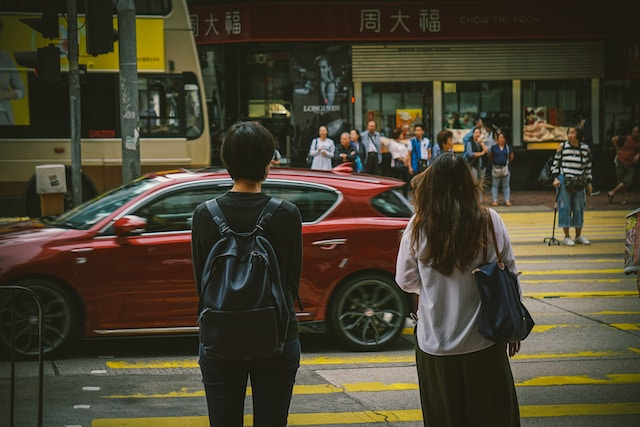

In [ ]:
from PIL import Image
import requests

url = "https://unsplash.com/photos/HwBAsSbPBDU/download?ixid=MnwxMjA3fDB8MXxzZWFyY2h8MzR8fGNhciUyMGluJTIwdGhlJTIwc3RyZWV0fGVufDB8MHx8fDE2Nzg5MDEwODg&force=true&w=640"
image = Image.open(requests.get(url, stream=True).raw)
image

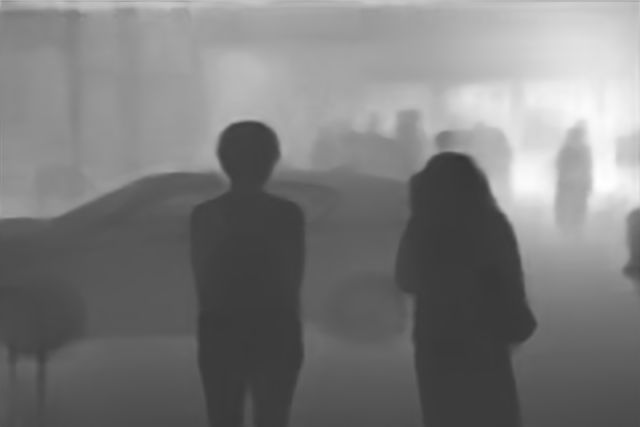

In [ ]:
predictions = depth_estimator(image)
predictions["depth"]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/MyDrive/val"
import pandas as pd

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=2, dim=(768, 1024), n_channels=3, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size: (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):
        """
        Updates indexes after each epoch
        """
        self.indices = self.data.index.tolist()  # Ensure indices are updated
        if self.shuffle:
            np.random.shuffle(self.indices)

    def load(self, image_path, depth_map, mask):
        """Load input and target image."""
        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

In [ ]:
import os
import cv2
import numpy as np

# Assuming 'df' is your DataFrame
data_generator = DataGenerator(data=df)

# Select the last 150 rows from the DataFrame
df_subset = df.tail(150)

# Specify the output folder
output_folder = "/content/"

# Create new folders if they don't exist
new_rgb_folder = os.path.join(output_folder, "new_RGB_images")
new_depth_folder = os.path.join(output_folder, "new_DEPTH_images")

os.makedirs(new_rgb_folder, exist_ok=True)
os.makedirs(new_depth_folder, exist_ok=True)

# Apply load method to all images and save them to folders
for index, row in df_subset.iterrows():
    image_path = row["image"]
    depth_map_path = row["depth"]
    mask_path = row["mask"]

    # Apply load method to each image in the DataFrame
    image_, depth_map = data_generator.load(image_path, depth_map_path, mask_path)

    # Convert TensorFlow tensor to NumPy array
    image_np = image_.numpy()

    # Save RGB image to RGB_images folder
    rgb_dest_path = os.path.join(new_rgb_folder, f"rgb_{index}.png")
    cv2.imwrite(rgb_dest_path, cv2.cvtColor((image_np * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))

    # Save depth map to DEPTH_images folder
    depth_dest_path = os.path.join(new_depth_folder, f"depth_{index}.png")
    cv2.imwrite(depth_dest_path, (depth_map[:, :, 0].numpy() * 255).astype(np.uint8))


In [ ]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.models as models


In [ ]:
class CustomDataset(Dataset):
    def __init__(self, root_dir_rgb, root_dir_depth, transform=None):
        self.root_dir_rgb = root_dir_rgb
        self.root_dir_depth = root_dir_depth
        self.transform = transform

        self.rgb_images = sorted(os.listdir(root_dir_rgb))
        self.depth_images = sorted(os.listdir(root_dir_depth))

    def __len__(self):
        return len(self.rgb_images)

    def __getitem__(self, idx):
        rgb_image_path = os.path.join(self.root_dir_rgb, self.rgb_images[idx])
        depth_image_path = os.path.join(self.root_dir_depth, self.depth_images[idx])

        rgb_image = Image.open(rgb_image_path).convert('RGB')
        depth_image = Image.open(depth_image_path).convert('L')  # Assuming depth images are grayscale

        if self.transform:
            rgb_image = self.transform(rgb_image)
            depth_image = self.transform(depth_image)

        return {'rgb': rgb_image, 'depth': depth_image}

# Data transformation
data_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])



In [ ]:
# For validation dataset (last 150 images)
val_dataset = CustomDataset(root_dir_rgb='/content/new_RGB_images',
                            root_dir_depth='/content/new_RGB_images',
                            transform=transforms.ToTensor())

In [ ]:
import torch
from torch.utils.data import DataLoader
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

import torch
from torchvision import transforms
from PIL import Image


# Define the DataLoader for the validation dataset
val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False)

# Define the loss function
criterion = nn.MSELoss()

# Initialize variables for tracking metrics
total_loss = 0.0
num_samples = 0
losses = []

# Initialize lists to store images for visualization
rgb_images = []
depth_gt_images = []
depth_generated_images = []

# Iterate over the validation dataset
with torch.no_grad():
    for batch in val_dataloader:
        inputs_rgb, inputs_depth = batch['rgb'], batch['depth']
        targets = batch['depth']

        # Convert PyTorch Tensor to NumPy array
        inputs_rgb_np = inputs_rgb.squeeze(0).permute(1, 2, 0).numpy()

        # Create PIL Image from NumPy array
        inputs_rgb_pil = Image.fromarray((inputs_rgb_np * 255).astype('uint8'))

        # Make predictions
        outputs = depth_estimator(inputs_rgb_pil)["depth"]
        print(type(outputs))

        transform = transforms.ToTensor()
        outputs_tensor = transform(outputs)

        # Flatten the NumPy array
        outputs_flat = outputs_tensor.view(-1)
        targets_flat = targets.view(-1)

        # Calculate the loss
        loss = criterion(outputs_flat, targets_flat)

        total_loss += loss.item()
        num_samples += 1
        losses.append(loss.item())

        # Append images for visualization
        rgb_images.append(inputs_rgb_pil)
        depth_gt_images.append(targets.squeeze(0).numpy())
        depth_generated_images.append(outputs.squeeze(0).numpy())


<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.Image.Image'>
<class 'PIL.

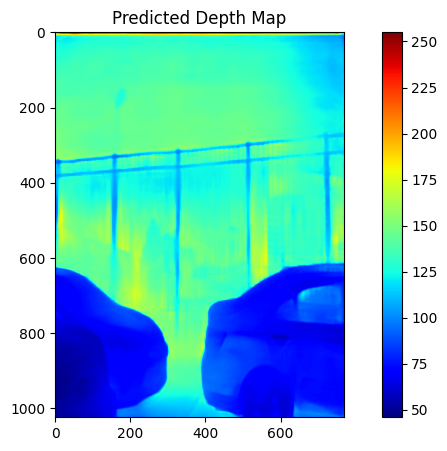

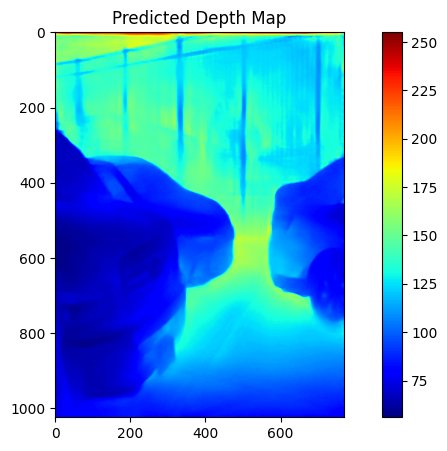

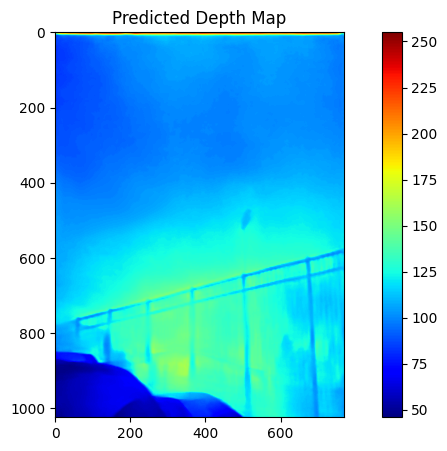

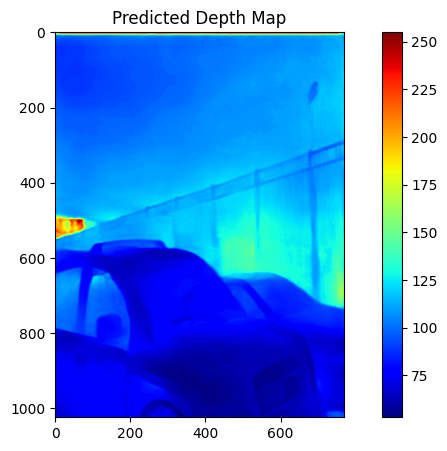

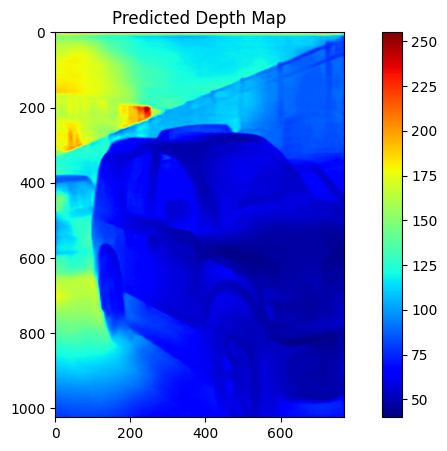

...

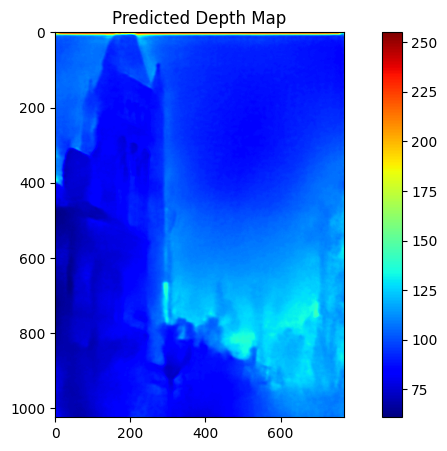

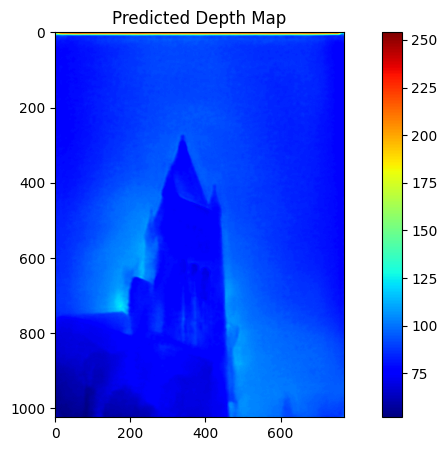

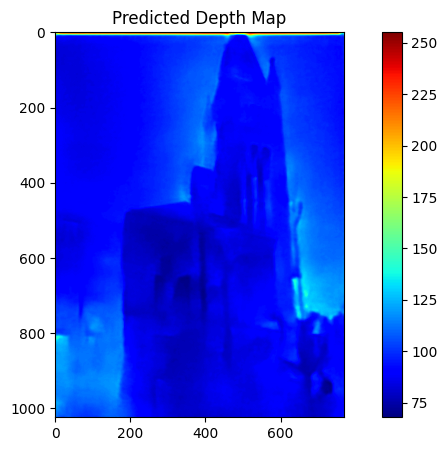

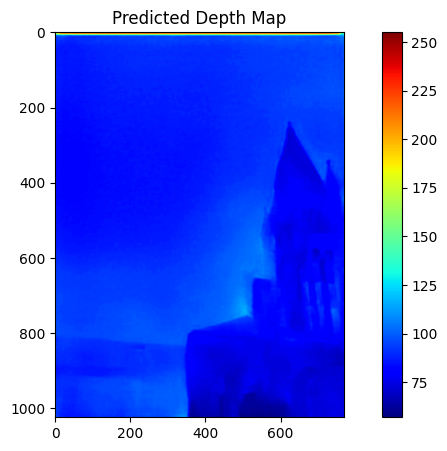

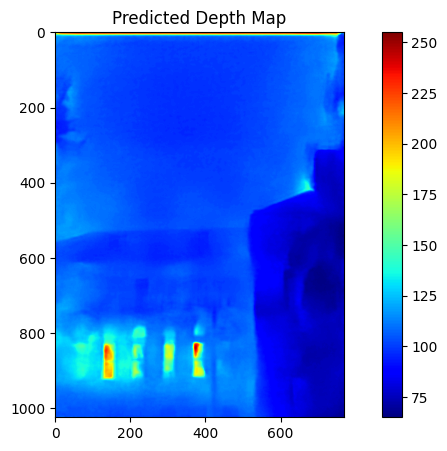

In [ ]:
import torch
from torch.utils.data import DataLoader
import torch.nn as nn
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

import torch
from torchvision import transforms
from PIL import Image



val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False)


# Iterate over the validation dataset
with torch.no_grad():
    for batch in val_dataloader:
        inputs_rgb, inputs_depth = batch['rgb'], batch['depth']
        targets = batch['depth']

        # Convert PyTorch Tensor to NumPy array
        inputs_rgb_np = inputs_rgb.squeeze(0).permute(1, 2, 0).numpy()

        # Create PIL Image from NumPy array
        inputs_rgb_pil = Image.fromarray((inputs_rgb_np * 255).astype('uint8'))

        # Make predictions
        outputs = depth_estimator(inputs_rgb_pil)["depth"]

        # Convert PyTorch Tensor to NumPy array for visualization

        outputs_np = outputs.squeeze(0).squeeze(0).numpy()


        # Plot the predicted depth map
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.title('Predicted Depth Map')
        plt.imshow(outputs_np, cmap='jet')
        plt.colorbar()

        # Convert PyTorch Tensor to NumPy array for target visualization
        targets_np = targets.squeeze(0).numpy()

        # Plot the target depth map
        plt.subplot(1, 2, 2)
        plt.title('Target Depth Map')
        plt.imshow(targets_np, cmap='jet')
        plt.colorbar()

        plt.show()


TypeError: Invalid shape (786432,) for image data

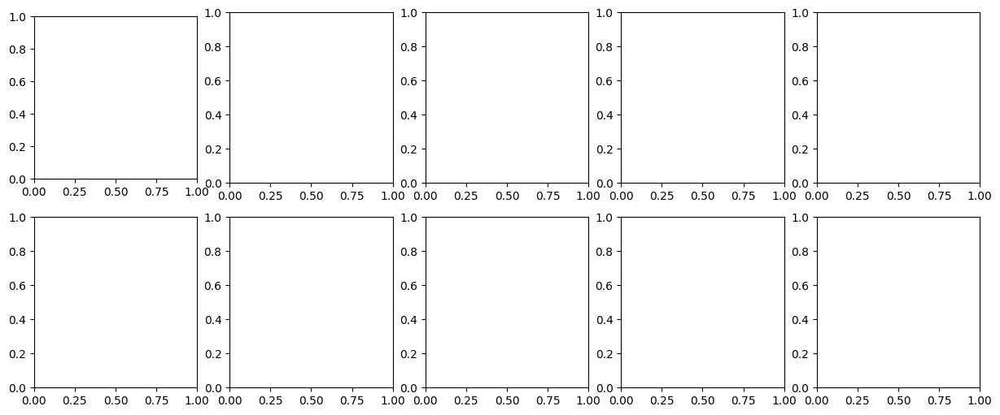

In [ ]:
import matplotlib.pyplot as plt
import random
from PIL import Image

# Select 5 random indices
random_indices = random.sample(range(len(depth_generated_images)), 5)

# Plot the selected random images and their RGB counterparts
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i in range(5):
    random_index = random_indices[i]

    # Plot the generated depth image
    ax_depth = axes[0, i]
    depth_generated_image = np.squeeze(depth_generated_images[random_index])
    ax_depth.imshow(Image.fromarray(depth_generated_image), cmap='viridis')
    ax_depth.set_title(f'Generated Depth {random_index}')
    ax_depth.axis('off')

    # Plot the corresponding RGB image
    ax_rgb = axes[1, i]
    rgb_image = rgb_images[random_index]
    ax_rgb.imshow(rgb_image)
    ax_rgb.set_title(f'RGB Image {random_index}')
    ax_rgb.axis('off')

plt.tight_layout()
plt.show()


Validation Loss: 0.06533989490941167


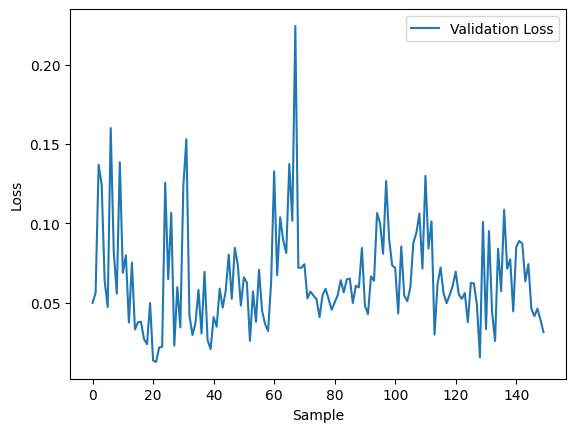

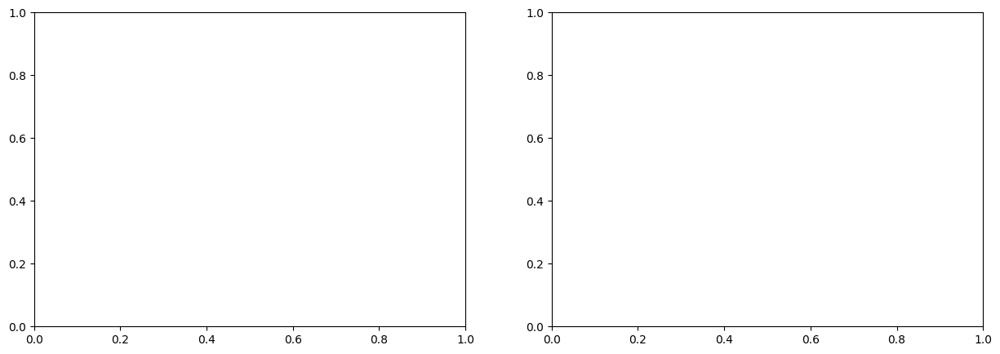

In [ ]:
# Calculate the average loss
average_loss = total_loss / num_samples
print(f'Validation Loss: {average_loss}')

# Plot the loss over validation
plt.plot(losses, label='Validation Loss')
plt.xlabel('Sample')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot three images (RGB, Depth Ground Truth, Generated Depth)
fig, axes = plt.subplots(1, 2, figsize=(15, 5))


# Display RGB Image
axes[0].imshow(rgb_images[149])
axes[0].set_title('RGB Image')
axes[0].axis('off')


# Display Generated Depth
depth_generated_image = np.squeeze(depth_generated_images[149])
axes[1].imshow(depth_generated_image, cmap='viridis')
axes[1].set_title('Generated Depth')
axes[1].axis('off')

plt.show()